In [1]:
# Import necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import lightgbm as lgb

import seaborn as sns
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score, precision_score, mean_absolute_error, r2_score, ConfusionMatrixDisplay,confusion_matrix, recall_score

In [2]:
df = pd.read_csv("/content/WineQT.csv")
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,2
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,3
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,4


In [3]:
print(f'Dataset has {len(df.columns)} and {len(df.index)} entries')

Dataset has 13 and 1143 entries


In [4]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'Id'],
      dtype='object')

In [5]:
df['quality'].unique()

array([5, 6, 7, 4, 8, 3])

In [6]:
for column in df.columns:
    print(f"Type of {column}: {type(df[column][0])}")

Type of fixed acidity: <class 'numpy.float64'>
Type of volatile acidity: <class 'numpy.float64'>
Type of citric acid: <class 'numpy.float64'>
Type of residual sugar: <class 'numpy.float64'>
Type of chlorides: <class 'numpy.float64'>
Type of free sulfur dioxide: <class 'numpy.float64'>
Type of total sulfur dioxide: <class 'numpy.float64'>
Type of density: <class 'numpy.float64'>
Type of pH: <class 'numpy.float64'>
Type of sulphates: <class 'numpy.float64'>
Type of alcohol: <class 'numpy.float64'>
Type of quality: <class 'numpy.int64'>
Type of Id: <class 'numpy.int64'>


In [7]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043,804.969379
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824,463.997116
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000,0.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000,411.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000,794.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000,1209.500000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000,1597.000000


In [8]:
# null check
df.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
Id                      0
dtype: int64

,count
quality,
3,6
4,33
5,483
6,462
7,143
8,16


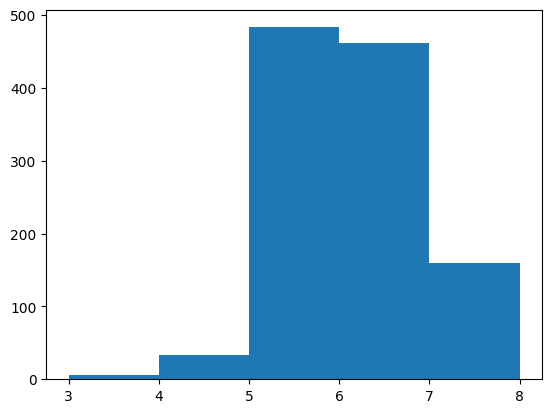

In [9]:
# without having any fe


import matplotlib.pyplot as plt
plt.hist(df["quality"], bins=5)
display(df.groupby("quality").agg(count=("quality", "count"))) # 5~6 are the decent wine while qualit > 6 is high quality, qualtiy < 5 is low .

In [10]:
quality_label = {3:"low", 4:"low",5:"mid", 6: "mid", 7:"high", 8:"high"}
df.loc[:, "quality_label"] = df.quality.map(quality_label)
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id,quality_label
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0,mid
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1,mid
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,2,mid
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,3,mid
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,4,mid


In [11]:
from sklearn.preprocessing import LabelEncoder
quality_encoder = LabelEncoder()
quality_encoder.fit(df["quality"].unique())
df.loc[:, "quality_encoded"] = quality_encoder.transform(df["quality"])
quality_encoder.classes_


array([3, 4, 5, 6, 7, 8])

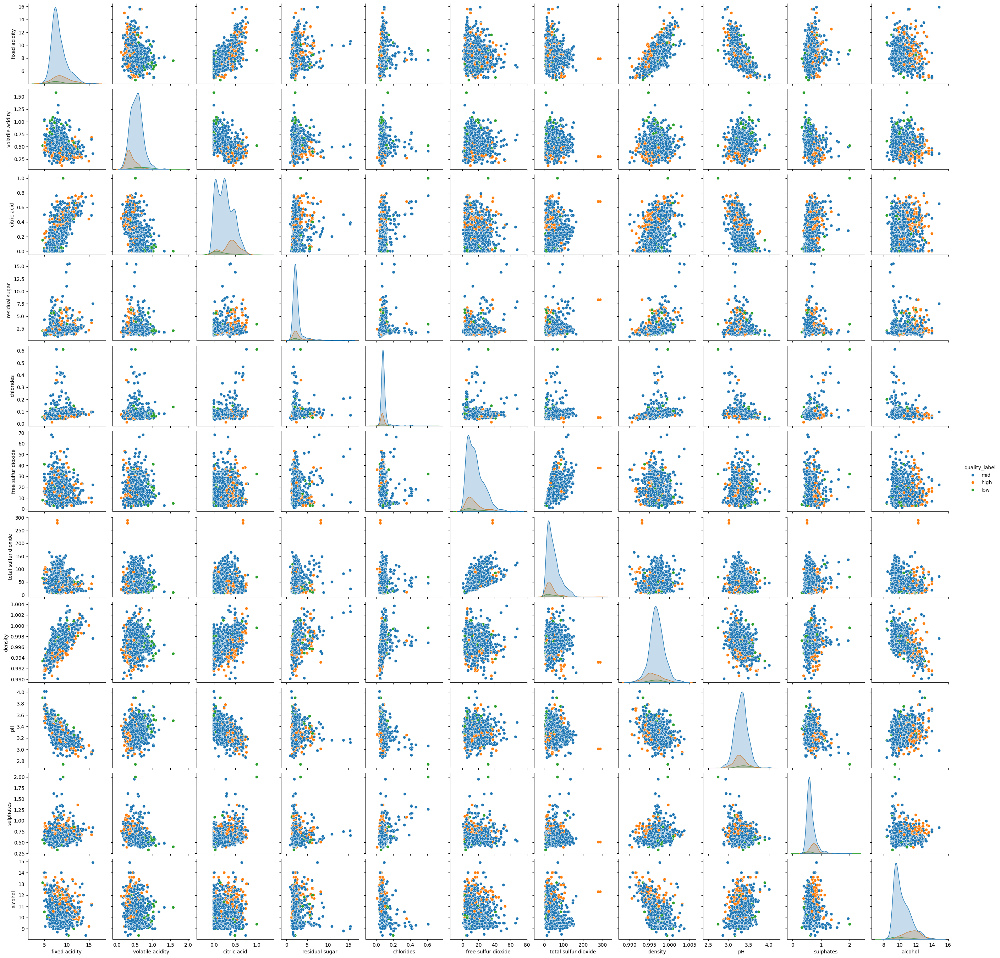

In [12]:
import seaborn as sn
sn.pairplot(df[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', "quality_label"]], hue="quality_label")

<Axes: xlabel='sulphates', ylabel='alcohol'>

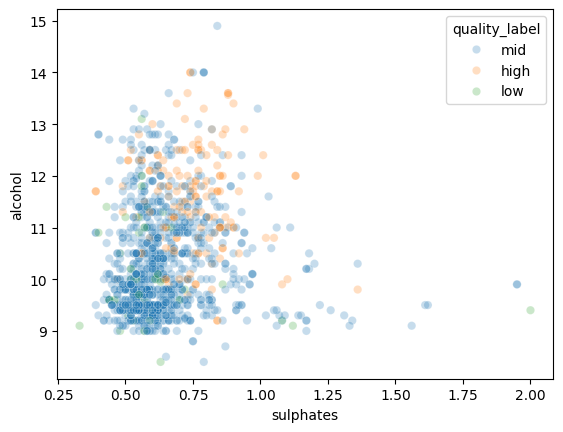

In [13]:
sn.scatterplot(data=df, x="sulphates", y="alcohol",hue="quality_label",alpha=0.25)

<Axes: xlabel='volatile acidity', ylabel='residual sugar'>

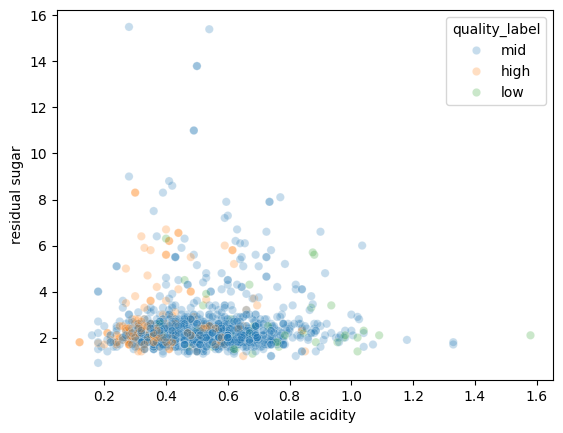

In [14]:
sn.scatterplot(data=df, x="volatile acidity", y="residual sugar",hue="quality_label",alpha=0.25)

In [15]:
df.shape

(1143, 15)

In [19]:
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier
from sklearn.metrics import mean_absolute_error, accuracy_score, precision_score, r2_score # if the problem is to classify wine quality so your resturant gains competitive advantage on a purchase of next coming wine
# prepare dataset
traget_cols = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', # Define the variable traget_cols before using it.
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol']
y_col = "quality"
y_dl_col = "quality_encoded" # Fix the typo here - add closing quotation mark.

X_train, X_test, y_train, y_test = train_test_split(
    df[traget_cols], df[y_col], test_size=0.25, random_state=42) # Use the correct variable name traget_cols.
# create validation dataset
X_train_train, X_valid_train, y_train_train, y_valid_train = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42) # Remove [target_cols] as X_train already contains only the target columns.

# # DL: prepare dataset For classification
# X_train_dl, X_test_dl, y_train_dl, y_test_dl = train_test_split(
#     df[traget_cols], df[y_dl_col], test_size=0.25, random_state=42) # Use the correct variable name traget_cols.
# # create validation dataset
# X_train_dl_train, X_valid_dl_train, y_train_dl_train, y_valid_dl_train = train_test_split(
#     X_train_dl, y_train_dl, test_size=0.2, random_state=42) # Remove [target_cols] as X_train_dl already contains only the target columns.


X_train.shape

(857, 11)

In [78]:
df.groupby('quality').mean()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,...,fixed_acidity_ratio,volatitlity_acidity_ratio,good_acidity_ratio,citric_fixed_acid,total_acid_alcohol_ratio,pH_alcohol_ratio,good_acidity_alchol_containment,chlorides_volatile_acid_effect,wine_flavor_metrics,chlorides_volatile_acid_sulphates_effect
quality,,,,,,,,,,,,,,,,,,,,,
3,8.450000,0.897500,0.211667,2.666667,0.105333,8.166667,24.500000,0.997682,3.361667,0.550000,...,0.882078,0.099769,0.900231,8.661667,1.005867,2.879179,29.476313,9.816763,0.621534,18.770128
4,7.809091,0.700000,0.165758,2.566667,0.094788,14.848485,40.606061,0.996669,3.391212,0.637879,...,0.897939,0.084518,0.915482,7.974848,0.859354,3.027139,30.600839,9.414443,0.853770,17.429988
5,8.161077,0.585280,0.240124,2.540476,0.091770,16.612836,55.299172,0.997073,3.302091,0.613375,...,0.907291,0.067347,0.932653,8.401201,0.912287,3.002607,30.365873,7.087151,0.620413,12.395496
6,8.317749,0.504957,0.263680,2.444805,0.085281,15.215368,39.941558,0.996610,3.323788,0.676537,...,0.914233,0.058492,0.941508,8.581429,0.863402,3.209217,31.632286,6.528814,0.572898,10.315874
7,8.851049,0.393671,0.386573,2.760140,0.075217,14.538462,37.489510,0.996071,3.287133,0.743566,...,0.917757,0.043775,0.956225,9.237622,0.851206,3.495974,33.101211,5.829194,0.504628,8.549687
8,8.806250,0.410000,0.432500,2.643750,0.070187,11.062500,29.375000,0.995553,3.240625,0.766250,...,0.910303,0.046298,0.953702,9.238750,0.822560,3.682787,33.687733,6.195811,0.453735,8.185702


In [20]:
ml_model = RandomForestRegressor()
ml_model.fit(X_train_train, y_train_train)
ml_predict = ml_model.predict(X_valid_train)

In [79]:
#Define y (dependent or target variable) and x (independent or atribute variable)

y = df['quality']
y.shape

(1143,)

In [21]:
# prepare the model
model = keras.Sequential([layers.Dense(16,input_shape=[11]),
                          layers.Activation("relu"),
                          layers.Dense(16, activation="relu"),
                          layers.Dense(1)])
model.compile(loss="mae", optimizer="adam")
hist = model.fit(X_train_train, y_train_train, batch_size=150, epochs=150, verbose=0)
dl_predict = model.predict(X_valid_train)

6/6 [==============================] - 0s 9ms/step


In [80]:
y


0       5
1       5
2       5
3       6
4       5
       ..
1138    6
1139    6
1140    5
1141    6
1142    5
Name: quality, Length: 1143, dtype: int64

In [81]:
#Use .drop function to define x

x = df.drop(['quality'], axis = 1)
x.shape

(1143, 30)

In [22]:
checks = pd.DataFrame({"predict": dl_predict.reshape([1, len(y_valid_train)])[0], "true": y_valid_train.values})

In [82]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,...,fixed_acidity_ratio,volatitlity_acidity_ratio,good_acidity_ratio,citric_fixed_acid,total_acid_alcohol_ratio,pH_alcohol_ratio,good_acidity_alchol_containment,chlorides_volatile_acid_effect,wine_flavor_metrics,chlorides_volatile_acid_sulphates_effect
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,...,0.913580,0.086420,0.913580,7.40,0.861702,2.678063,29.304700,9.210526,0.452766,16.447368
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,...,0.898618,0.101382,0.898618,7.80,0.885714,3.062500,29.675666,8.979592,0.680000,13.205282
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,...,0.906977,0.088372,0.911628,7.84,0.877551,3.006135,29.889720,8.260870,0.610204,12.709030
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,...,0.930233,0.023256,0.976744,11.76,1.228571,3.101266,30.938799,3.733333,0.443878,6.436782
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,...,0.913580,0.086420,0.913580,7.40,0.861702,2.678063,29.304700,9.210526,0.452766,16.447368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,...,0.907781,0.073487,0.926513,6.43,0.630909,3.216374,31.924352,6.710526,0.518182,8.947368
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,...,0.906667,0.082667,0.917333,6.88,0.789474,2.777778,29.520614,9.117647,0.586947,11.119082
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,...,0.901163,0.087209,0.912791,6.28,0.655238,3.043478,30.958524,6.666667,0.497143,11.494253
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,...,0.900763,0.083969,0.916031,6.00,0.584821,3.181818,32.030520,8.870968,0.420714,11.672326


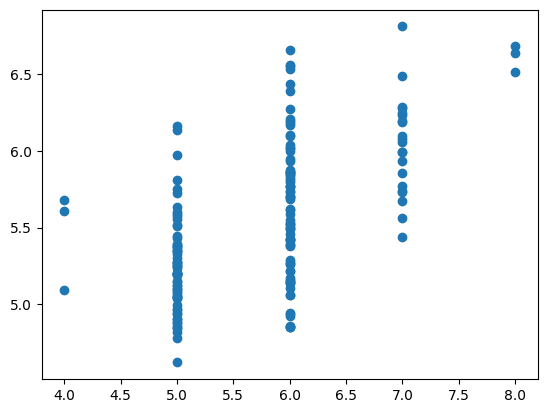

In [23]:
plt.scatter(x=checks["true"], y=checks["predict"])

In [83]:
#Get x variable standardize

from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
x = ss.fit_transform(x)
x

array([[-0.52157961,  0.93933222, -1.36502663, ...,  0.83026496,
        -0.19998142,  0.83411443],
       [-0.29259344,  1.94181282, -1.36502663, ...,  0.75160027,
         0.12844246,  0.31937949],
       [-0.29259344,  1.27349242, -1.16156762, ...,  0.50677732,
         0.02756564,  0.24059126],
       ...,
       [-1.20853813,  0.38239855, -0.9581086 , ..., -0.0362662 ,
        -0.135843  ,  0.04772524],
       [-1.38027776,  0.10393172, -0.8563791 , ...,  0.71459895,
        -0.24630606,  0.0759973 ],
       [-1.38027776,  0.6330187 , -0.75464959, ...,  0.62229748,
        -0.09983167,  0.14591017]])

<Axes: >

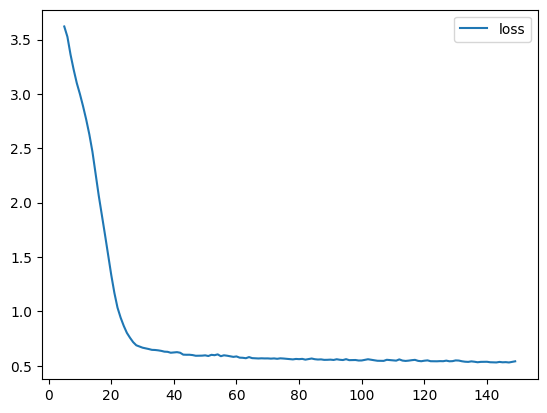

In [24]:
history_df = pd.DataFrame(hist.history)
# Start the plot at epoch 5. You can change this to get a different view.
history_df.loc[5:, ['loss']].plot()

In [84]:
#Get train test split

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state = 42)
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((914, 30), (229, 30), (914,), (229,))

In [85]:
#Get model train

from sklearn.svm import SVC
svc = SVC()
svc.fit(x_train, y_train)

SVC()

In [86]:
#Get model prediction

y_pred = svc.predict(x_test)
y_pred.shape

(229,)

In [87]:
y_pred

array([5, 6, 5, 5, 6, 7, 5, 5, 6, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 6, 6, 6,
       5, 7, 6, 5, 7, 6, 5, 6, 6, 6, 6, 5, 6, 5, 6, 7, 6, 5, 7, 5, 6, 5,
       4, 5, 6, 6, 5, 6, 7, 5, 6, 7, 5, 7, 6, 4, 6, 5, 5, 6, 5, 6, 6, 6,
       6, 5, 5, 5, 6, 5, 6, 6, 5, 5, 5, 5, 5, 6, 5, 6, 5, 6, 6, 6, 6, 5,
       6, 6, 5, 5, 5, 5, 5, 5, 6, 7, 6, 6, 7, 6, 5, 6, 5, 5, 6, 7, 6, 7,
       7, 5, 5, 5, 6, 5, 5, 7, 6, 5, 5, 5, 5, 6, 5, 6, 6, 6, 5, 6, 5, 5,
       7, 6, 5, 5, 5, 6, 5, 6, 7, 6, 6, 5, 7, 5, 5, 5, 5, 5, 7, 6, 6, 5,
       6, 6, 5, 5, 7, 5, 5, 5, 6, 5, 7, 5, 6, 4, 6, 5, 6, 5, 5, 6, 5, 5,
       7, 5, 6, 6, 6, 5, 6, 6, 5, 5, 6, 5, 6, 5, 6, 6, 7, 6, 5, 6, 5, 7,
       7, 6, 6, 6, 5, 5, 7, 7, 5, 5, 6, 6, 5, 6, 6, 6, 5, 6, 7, 5, 6, 6,
       6, 5, 5, 5, 5, 6, 5, 6, 6])

In [88]:
#Get model evaluation

from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(y_test, y_pred))

[[ 3  3  0  0  0]
 [ 0 96  0  0  0]
 [ 0  3 96  0  0]
 [ 0  0  0 26  0]
 [ 0  0  0  2  0]]


In [89]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           4       1.00      0.50      0.67         6
           5       0.94      1.00      0.97        96
           6       1.00      0.97      0.98        99
           7       0.93      1.00      0.96        26
           8       0.00      0.00      0.00         2

    accuracy                           0.97       229
   macro avg       0.77      0.69      0.72       229
weighted avg       0.96      0.97      0.96       229



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [90]:
#Get model re-run with two class created for wine quality

y = df['quality'].apply(lambda y_value: 1 if y_value >= 6 else 0)
y.value_counts()

quality
1    621
0    522
Name: count, dtype: int64

In [91]:
#Get train test split

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state =42)
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((914, 30), (229, 30), (914,), (229,))

In [92]:
#Get model train

svc.fit(x_train, y_train)

SVC()

In [93]:
#Get model prediction

y_pred = svc.predict(x_test)
y_pred.shape

(229,)

In [94]:
y_pred

array([0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0,
       0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1,
       1, 0, 0, 0, 0, 1, 0, 1, 1])

In [95]:
#Get model evaluation

from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(y_test, y_pred))

[[102   0]
 [  3 124]]


In [96]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      1.00      0.99       102
           1       1.00      0.98      0.99       127

    accuracy                           0.99       229
   macro avg       0.99      0.99      0.99       229
weighted avg       0.99      0.99      0.99       229



In [97]:
#Get model re-run with two class created for wine quality

y = df['quality'].apply(lambda y_value: 1 if y_value >= 6 else 0)
y.value_counts()

quality
1    621
0    522
Name: count, dtype: int64

In [98]:
#Get train test split

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state =42)
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((914, 30), (229, 30), (914,), (229,))

In [25]:
print("Deep Learning Model Score:",mean_absolute_error(y_valid_train, dl_predict))
print("Deep Learning Model R2:",r2_score(y_valid_train, dl_predict))

print("RandomForest Model Accuracy:", mean_absolute_error(y_valid_train, ml_predict))
print("RandomForest Model r2_score:", r2_score(y_valid_train, ml_predict))

Deep Learning Model Score: 0.5059945805128231
Deep Learning Model R2: 0.28511729396035657
RandomForest Model Accuracy: 0.41930232558139535
RandomForest Model r2_score: 0.4727479822719852


In [26]:
result_df = pd.DataFrame({"ml_pred":ml_predict,"dl_pred": dl_predict.reshape(1, len(dl_predict))[0], "true":y_valid_train})
result_df.loc[:, "result"] = result_df.apply(lambda data: data["dl_pred"] == data["true"], axis=1)

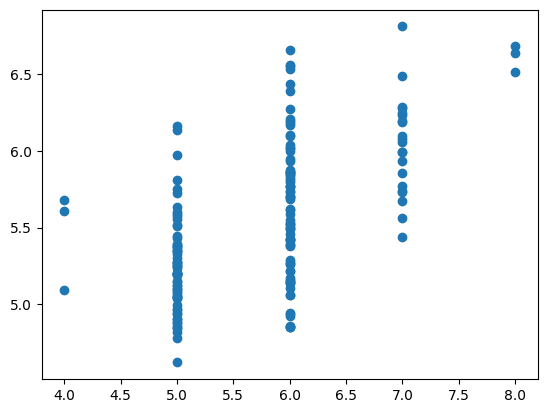

In [27]:
plt.scatter(x=result_df["true"], y=result_df["dl_pred"])

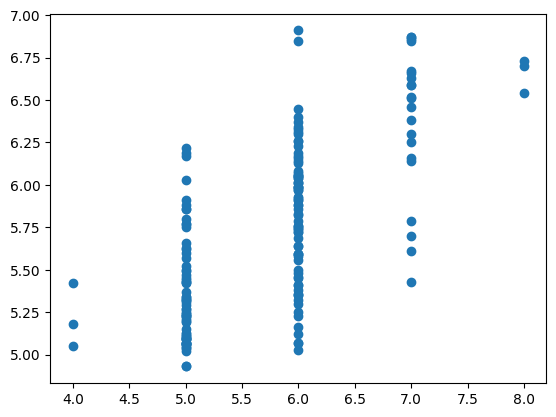

In [28]:
plt.scatter(x=result_df["true"], y=result_df["ml_pred"])

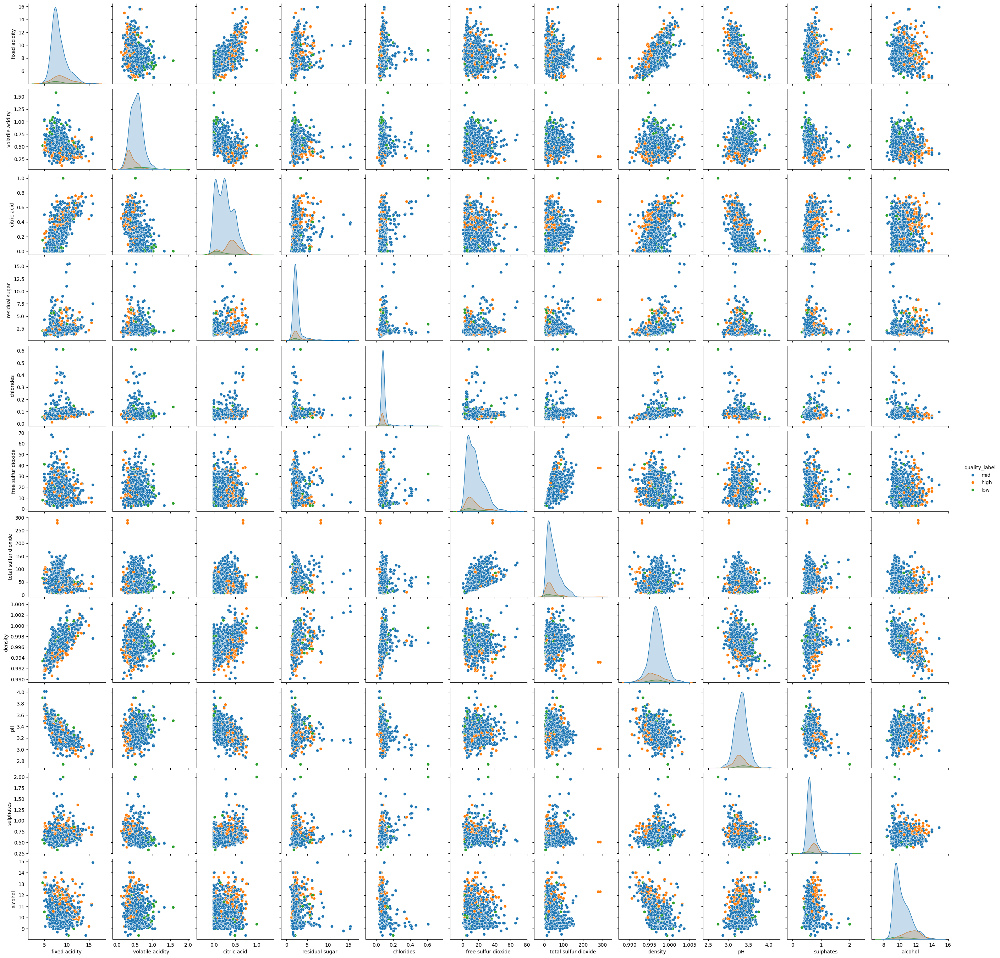

In [29]:
#EDA
sn.pairplot(df[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', "quality_label"]], hue="quality_label")

In [31]:
# Convert the 'quality_label' column to a numerical representation if it contains strings.
# For example, if 'quality_label' has ordinal categories like 'low', 'mid', 'high', you can map them to numbers:
quality_mapping = {'low': 0, 'mid': 1, 'high': 2}
df['quality_label'] = df['quality_label'].map(quality_mapping)

# Now calculate the correlations:
df.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id,quality_label,quality_encoded
fixed acidity,1.000000,-0.250728,0.673157,0.171831,0.107889,-0.164831,-0.110628,0.681501,-0.685163,0.174592,-0.075055,0.121970,-0.275826,0.125435,0.121970
volatile acidity,-0.250728,1.000000,-0.544187,-0.005751,0.056336,-0.001962,0.077748,0.016512,0.221492,-0.276079,-0.203909,-0.407394,-0.007892,-0.355576,-0.407394
citric acid,0.673157,-0.544187,1.000000,0.175815,0.245312,-0.057589,0.036871,0.375243,-0.546339,0.331232,0.106250,0.240821,-0.139011,0.256968,0.240821
residual sugar,0.171831,-0.005751,0.175815,1.000000,0.070863,0.165339,0.190790,0.380147,-0.116959,0.017475,0.058421,0.022002,-0.046344,0.051997,0.022002
chlorides,0.107889,0.056336,0.245312,0.070863,1.000000,0.015280,0.048163,0.208901,-0.277759,0.374784,-0.229917,-0.124085,-0.088099,-0.106343,-0.124085
free sulfur dioxide,-0.164831,-0.001962,-0.057589,0.165339,0.015280,1.000000,0.661093,-0.054150,0.072804,0.034445,-0.047095,-0.063260,0.095268,-0.033256,-0.063260
total sulfur dioxide,-0.110628,0.077748,0.036871,0.190790,0.048163,0.661093,1.000000,0.050175,-0.059126,0.026894,-0.188165,-0.183339,-0.107389,-0.077283,-0.183339
density,0.681501,0.016512,0.375243,0.380147,0.208901,-0.054150,0.050175,1.000000,-0.352775,0.143139,-0.494727,-0.175208,-0.363926,-0.131914,-0.175208
pH,-0.685163,0.221492,-0.546339,-0.116959,-0.277759,0.072804,-0.059126,-0.352775,1.000000,-0.185499,0.225322,-0.052453,0.132904,-0.103926,-0.052453
sulphates,0.174592,-0.276079,0.331232,0.017475,0.374784,0.034445,0.026894,0.143139,-0.185499,1.000000,0.094421,0.257710,-0.103954,0.195327,0.257710


In [32]:
potential_features = df.columns
potential_features = potential_features.drop("Id")
potential_features = potential_features.drop("quality")


In [33]:
# check relation with quality
corr_df = df.corr()
corr_df["quality"]

fixed acidity           0.121970
volatile acidity       -0.407394
citric acid             0.240821
residual sugar          0.022002
chlorides              -0.124085
free sulfur dioxide    -0.063260
total sulfur dioxide   -0.183339
density                -0.175208
pH                     -0.052453
sulphates               0.257710
alcohol                 0.484866
quality                 1.000000
Id                      0.069708
quality_label           0.809497
quality_encoded         1.000000
Name: quality, dtype: float64

<Axes: xlabel='citric acid', ylabel='fixed acidity'>

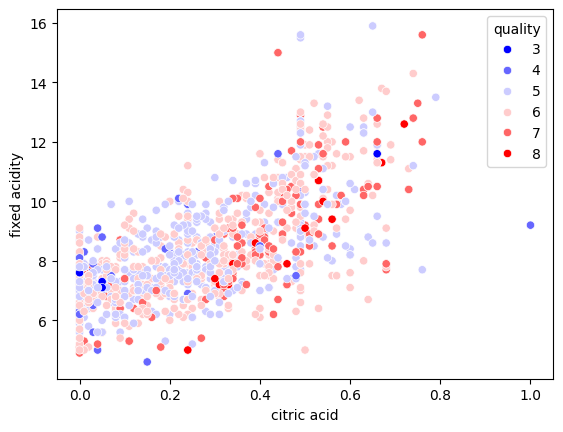

In [34]:
sn.scatterplot(data=df, x="citric acid",y="fixed acidity",hue="quality", palette="bwr")

<Axes: xlabel='citric acid', ylabel='fixed acidity'>

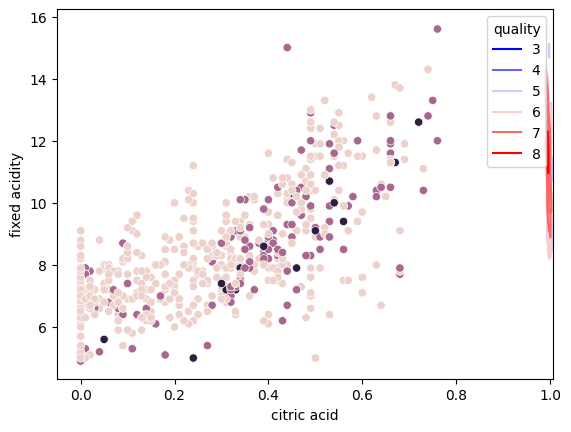

In [35]:
sn.scatterplot(data=df.loc[df["quality"] > 5], x="citric acid",y="fixed acidity",hue="quality")
sn.kdeplot(data=df, x="density",y="alcohol",hue="quality",palette="bwr")

<Axes: xlabel='volatile acidity', ylabel='Density'>

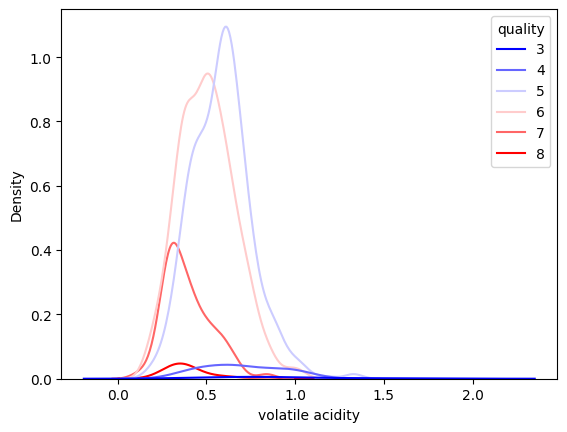

In [36]:
sn.kdeplot(data=df, x="volatile acidity", hue="quality",palette="bwr")
# negative impact on high quality wine

<Axes: xlabel='total sulfur dioxide', ylabel='Density'>

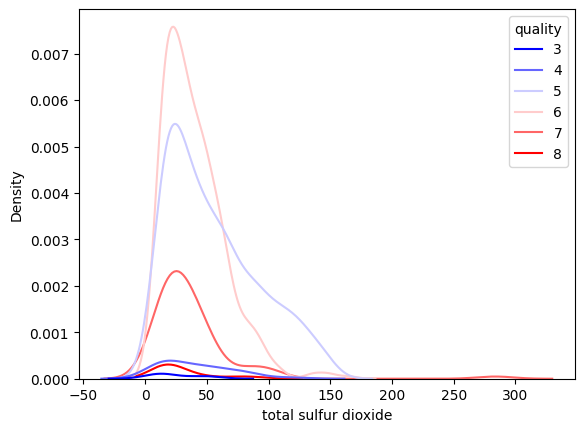

In [37]:
sn.kdeplot(data=df, x="total sulfur dioxide", hue="quality",palette="bwr")

<Axes: xlabel='sulphates', ylabel='residual sugar'>

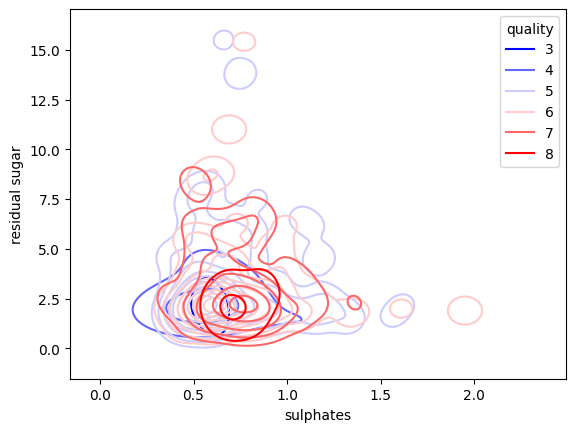

In [38]:
sn.kdeplot(data=df, x="sulphates", y="residual sugar",hue="quality",palette="bwr")

<Axes: xlabel='residual sugar', ylabel='Density'>

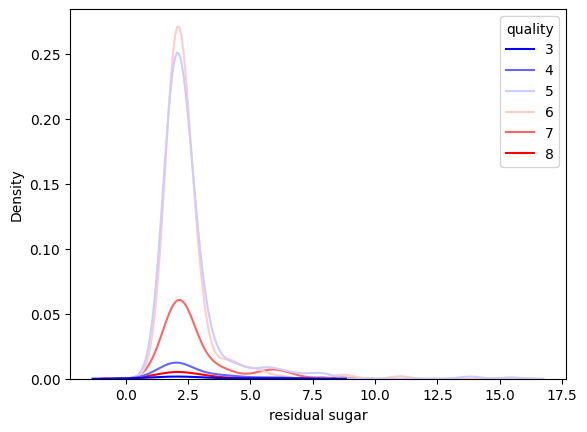

In [39]:
sn.kdeplot(data=df, x="residual sugar",hue="quality",palette="bwr")

<Axes: xlabel='sulphates_sugar_ratio', ylabel='Density'>

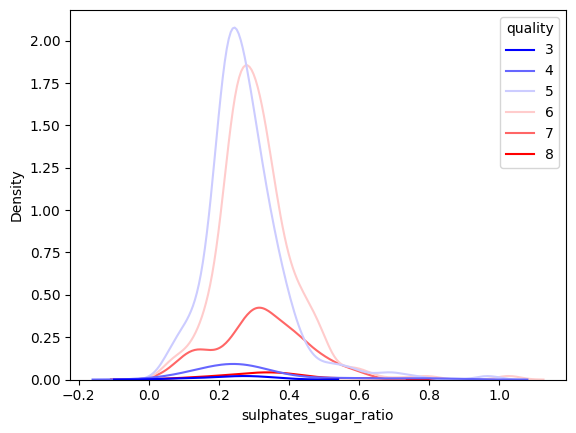

In [40]:
df.loc[:, "sulphates_sugar_ratio"] = df["sulphates"]/df["residual sugar"]
sn.kdeplot(data=df, x="sulphates_sugar_ratio", hue="quality",palette="bwr")

<Axes: xlabel='total sulfur dioxide', ylabel='free sulfur dioxide'>

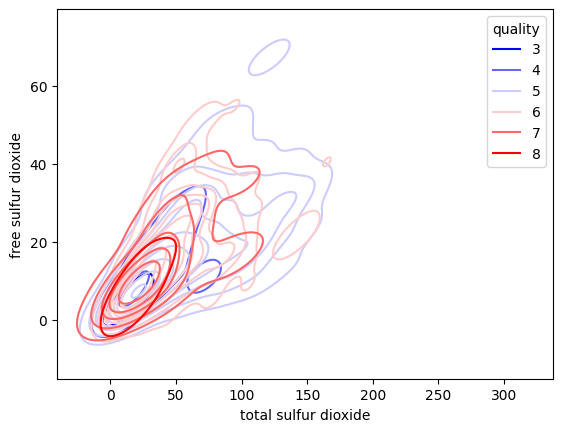

In [41]:
sn.kdeplot(data=df, x="total sulfur dioxide", y="free sulfur dioxide",hue="quality",palette="bwr")

<Axes: xlabel='free_sulfur_dioxide_ratio', ylabel='Density'>

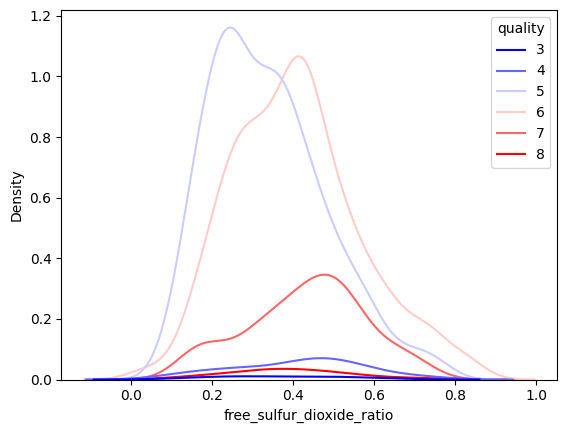

In [42]:
df.loc[:, "free_sulfur_dioxide_ratio"] = df["free sulfur dioxide"] / df["total sulfur dioxide"]
sn.kdeplot(data=df, x="free_sulfur_dioxide_ratio",hue="quality",palette="bwr")

<Axes: xlabel='non_free_sulfur_dioxide', ylabel='Density'>

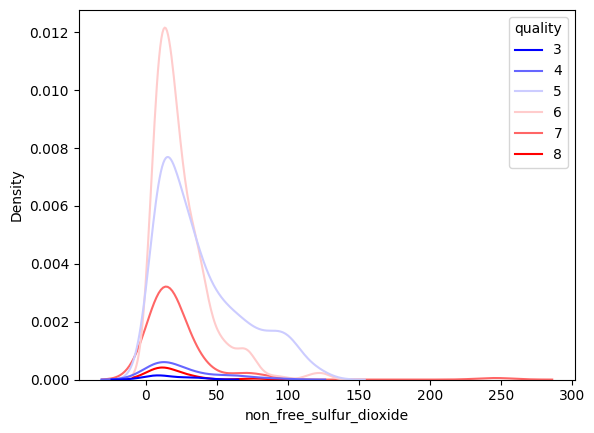

In [43]:
df.loc[:, "non_free_sulfur_dioxide"] =  df["total sulfur dioxide"]-df["free sulfur dioxide"]

sn.kdeplot(data=df, x="non_free_sulfur_dioxide",hue="quality",palette="bwr")

<Axes: xlabel='free_sulfur_dioxide_ratio', ylabel='alcohol'>

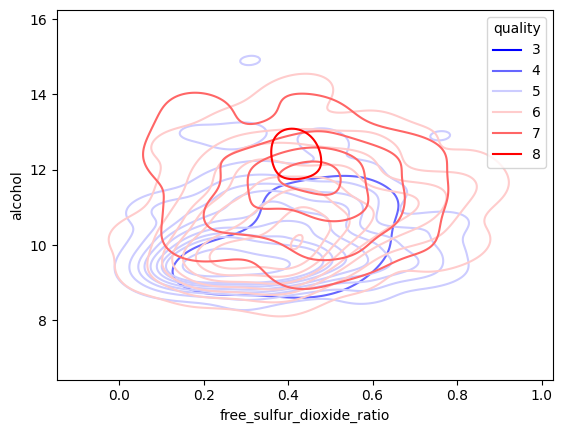

In [44]:
sn.kdeplot(data=df, x="free_sulfur_dioxide_ratio",y="alcohol",hue="quality",palette="bwr")

<Axes: xlabel='total sulfur dioxide', ylabel='Density'>

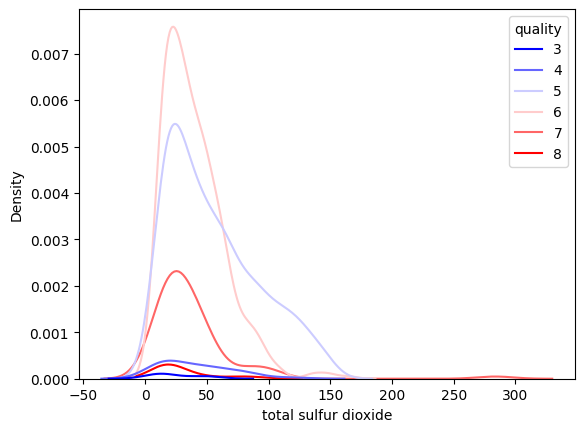

In [45]:
sn.kdeplot(data=df, x="total sulfur dioxide",hue="quality",palette="bwr")

<Axes: xlabel='residual sugar', ylabel='pH'>

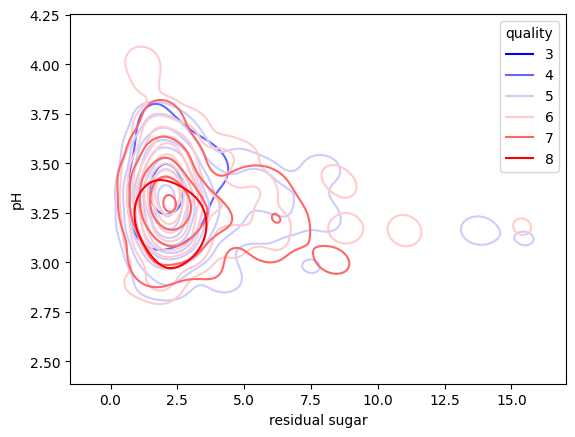

In [46]:
sn.kdeplot(data=df, x="residual sugar", y="pH",hue="quality",palette="bwr")

<Axes: xlabel='citric acid', ylabel='fixed acidity'>

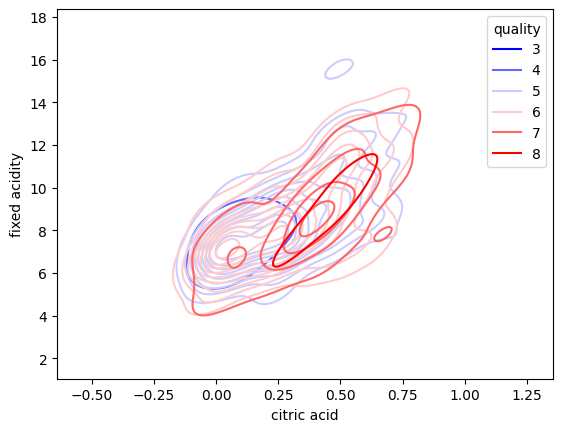

In [47]:
sn.kdeplot(data=df, x="citric acid", y="fixed acidity",hue="quality",palette="bwr")

<Axes: xlabel='citric_fixed_acidity_ratio', ylabel='Density'>

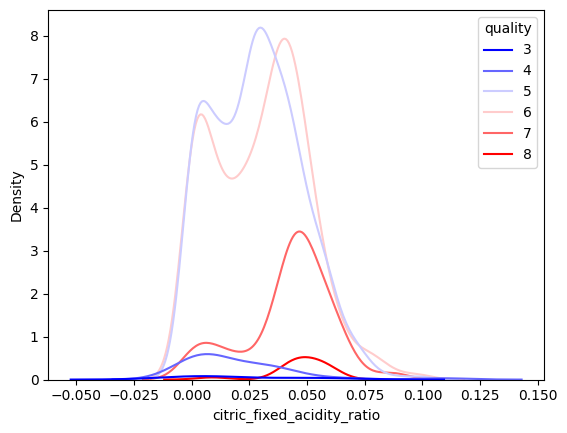

In [48]:
# if this acidity is high => quality tends to be higher
df.loc[:, "citric_fixed_acidity_ratio"] = df["citric acid"] / df["fixed acidity"]
sn.kdeplot(data=df, x="citric_fixed_acidity_ratio", hue="quality",palette="bwr")

<Axes: xlabel='citric_acid_ratio', ylabel='Density'>

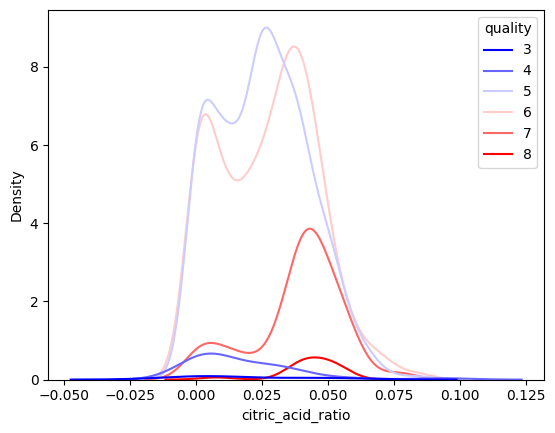

In [49]:
# is there any acidity type which has some impacts on wine quality
df.loc[:, "total_acid"] = df["volatile acidity"] + df["citric acid"] + df["fixed acidity"]

df.loc[:, "citric_acid_ratio"] = df["citric acid"] / df["total_acid"]
df.loc[:, "fixed_acidity_ratio"] = df["fixed acidity"] / df["total_acid"]
df.loc[:, "volatitlity_acidity_ratio"] = df["volatile acidity"] / df["total_acid"]
sn.kdeplot(data=df, x="citric_acid_ratio", hue="quality",palette="bwr")

<Axes: xlabel='volatitlity_acidity_ratio', ylabel='Density'>

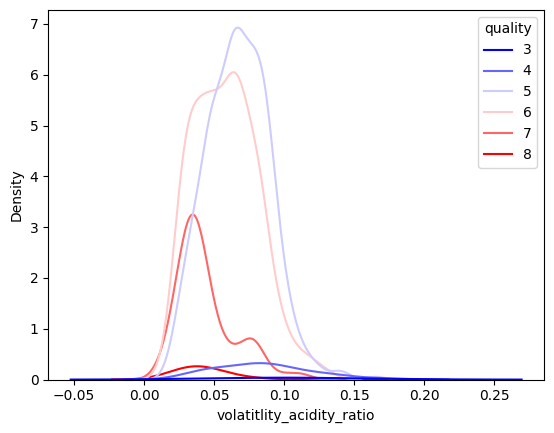

In [50]:
sn.kdeplot(data=df, x="volatitlity_acidity_ratio", hue="quality",palette="bwr")

<Axes: xlabel='good_acidity_ratio', ylabel='Density'>

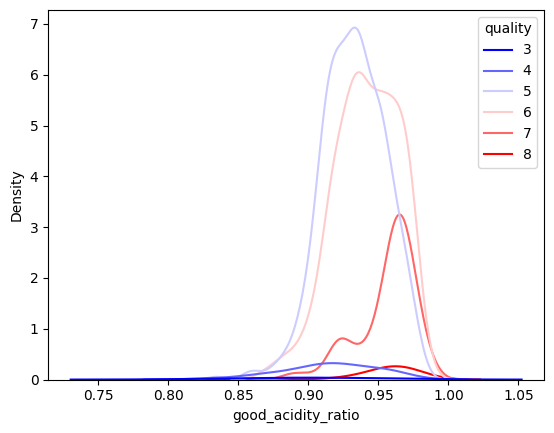

In [51]:
# Good acidity ratio
df.loc[:, "good_acidity_ratio"] =  (df["citric acid"] + df["fixed acidity"])/df["total_acid"]
sn.kdeplot(data=df, x="good_acidity_ratio", hue="quality",palette="bwr")

<Axes: xlabel='alcohol', ylabel='citric acid'>

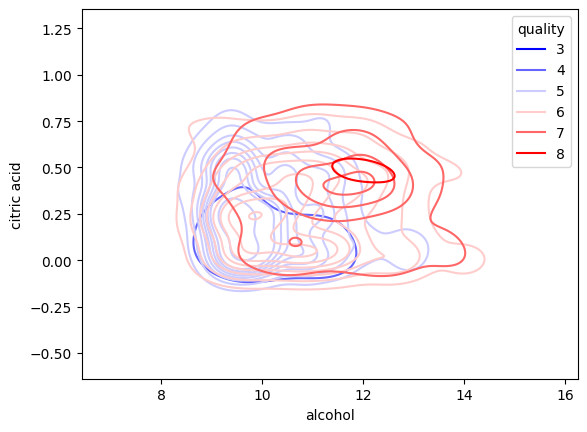

In [52]:
sn.kdeplot(data=df, x="alcohol",y="citric acid",hue="quality",palette="bwr")

<Axes: xlabel='sulphates', ylabel='Density'>

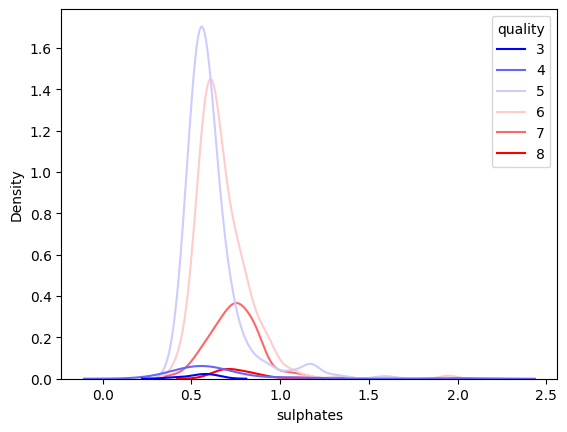

In [53]:
sn.kdeplot(data=df, x="sulphates", hue="quality",palette="bwr")
# sulphates: chemical (?) which keeps the food quality


<Axes: xlabel='citric_fixed_acid', ylabel='Density'>

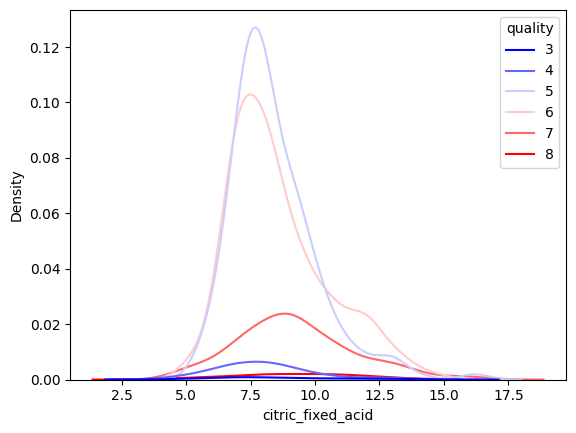

In [54]:
df.loc[:, "citric_fixed_acid"] = df["citric acid"] + df["fixed acidity"]
sn.kdeplot(data=df, x="citric_fixed_acid",hue="quality",palette="bwr")

<Axes: xlabel='total_acid', ylabel='alcohol'>

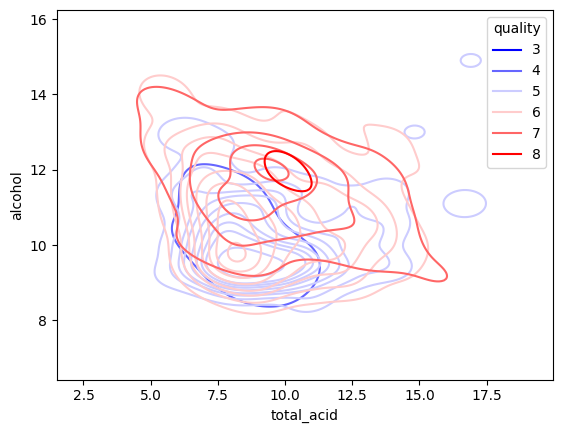

In [55]:
sn.kdeplot(data=df, x="total_acid", y="alcohol",hue="quality",palette="bwr")

<Axes: xlabel='total_acid_alcohol_ratio', ylabel='Density'>

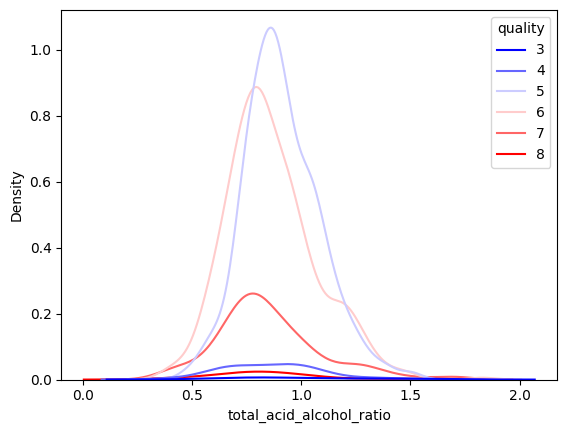

In [56]:
df.loc[:, "total_acid_alcohol_ratio"] = df["total_acid"] / df["alcohol"]
sn.kdeplot(data=df, x="total_acid_alcohol_ratio",hue="quality",palette="bwr")

<Axes: xlabel='pH', ylabel='alcohol'>

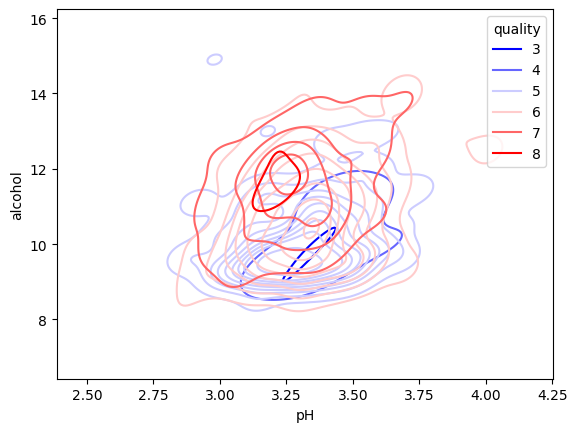

In [57]:
# Assumption: if the wine is acidic, but no enough alcohol amount would ruin the tast of itself
df.loc[:, "pH_alcohol_ratio"] = df["alcohol"] / df["pH"]
sn.kdeplot(data=df, x="pH",y="alcohol",hue="quality",palette="bwr")

<Axes: xlabel='pH_alcohol_ratio', ylabel='Density'>

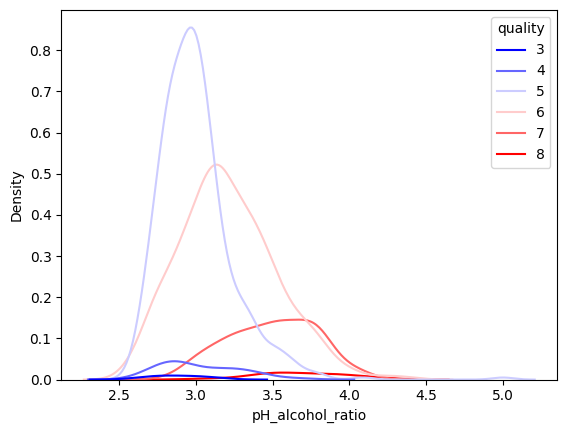

In [58]:
sn.kdeplot(data=df, x="pH_alcohol_ratio",hue="quality",palette="bwr")

<Axes: xlabel='citric_fixed_acidity_ratio', ylabel='free_sulfur_dioxide_ratio'>

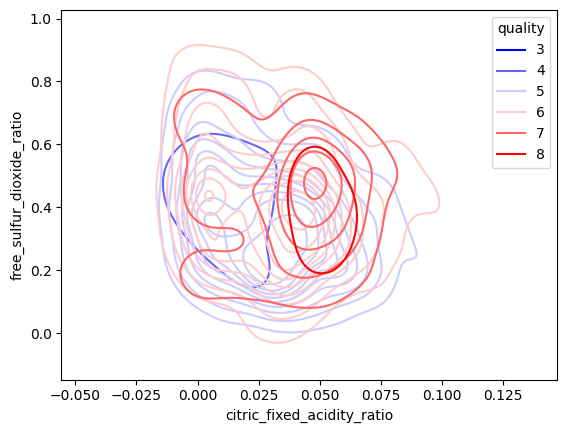

In [59]:
sn.kdeplot(data=df, x="citric_fixed_acidity_ratio",y="free_sulfur_dioxide_ratio",hue="quality",palette="bwr")

In [60]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'Id', 'quality_label',
       'quality_encoded', 'sulphates_sugar_ratio', 'free_sulfur_dioxide_ratio',
       'non_free_sulfur_dioxide', 'citric_fixed_acidity_ratio', 'total_acid',
       'citric_acid_ratio', 'fixed_acidity_ratio', 'volatitlity_acidity_ratio',
       'good_acidity_ratio', 'citric_fixed_acid', 'total_acid_alcohol_ratio',
       'pH_alcohol_ratio'],
      dtype='object')

<Axes: xlabel='good_acidity_ratio', ylabel='Density'>

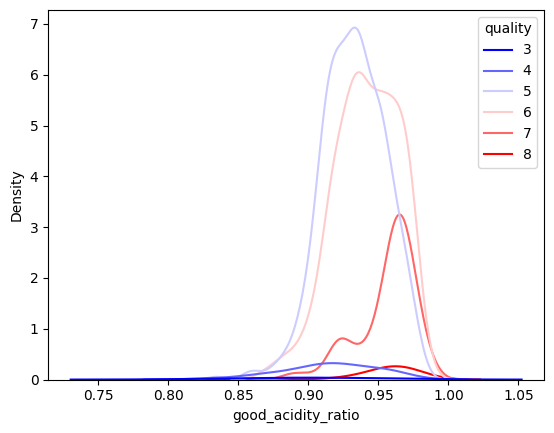

In [61]:
# Assumption：Wine quality is not decided by one strong aspect, instead good tast is a harmony of Acidity/Sweetness/Bitterness?
sns.kdeplot(data=df, x="good_acidity_ratio", hue="quality",palette="bwr")

<Axes: xlabel='good_acidity_ratio', ylabel='alcohol'>

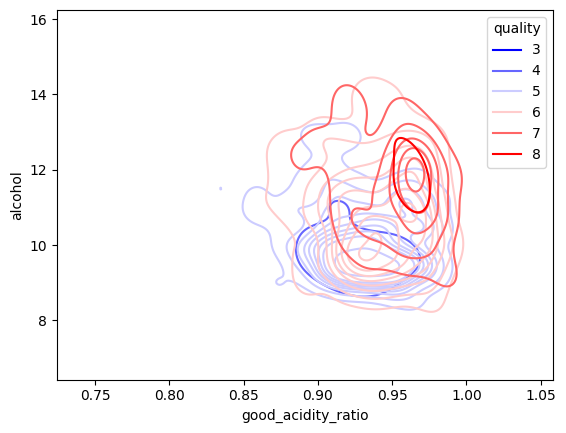

In [62]:
sns.kdeplot(data=df, x="good_acidity_ratio", y="alcohol",hue="quality",palette="bwr")


In [63]:
"""
Combination of Good Acidity Ratio and alchohol would better grasp the relation.
=> Meaning like it might help separating decent good from decent bad.
"""

'\nCombination of Good Acidity Ratio and alchohol would better grasp the relation.\n=> Meaning like it might help separating decent good from decent bad.\n'

<Axes: xlabel='alcohol', ylabel='Density'>

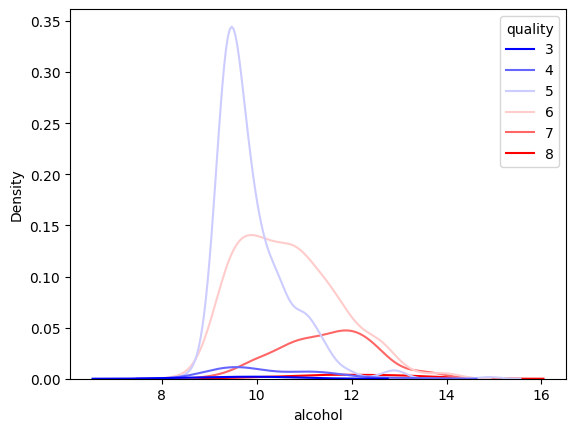

In [64]:
sns.kdeplot(data=df, x="alcohol",hue="quality",palette="bwr")

<Axes: xlabel='good_acidity_alchol_containment', ylabel='Density'>

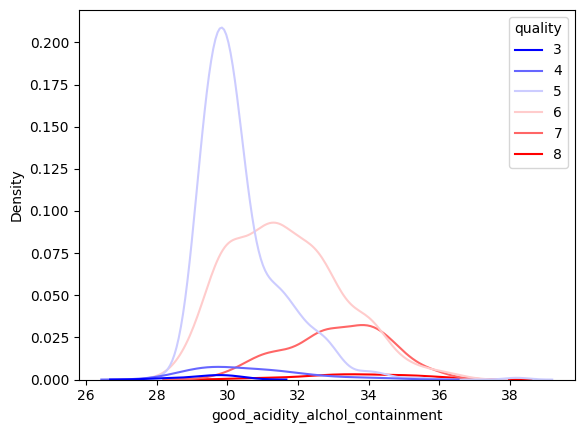

In [65]:
df.loc[:, "good_acidity_alchol_containment"] = np.sqrt((df["good_acidity_ratio"]*100) * df["alcohol"]) # by multipling 100, standardize unit <= 酸味とアルコールの
sns.kdeplot(data=df, x="good_acidity_alchol_containment", hue="quality",palette="bwr")


In [66]:
"some articles explaining wine jargons says that high density means that wine is comprised of high alcohol and tannin which might be a good indicator of high bitterness of wine"

'some articles explaining wine jargons says that high density means that wine is comprised of high alcohol and tannin which might be a good indicator of high bitterness of wine'

<Axes: xlabel='density', ylabel='alcohol'>

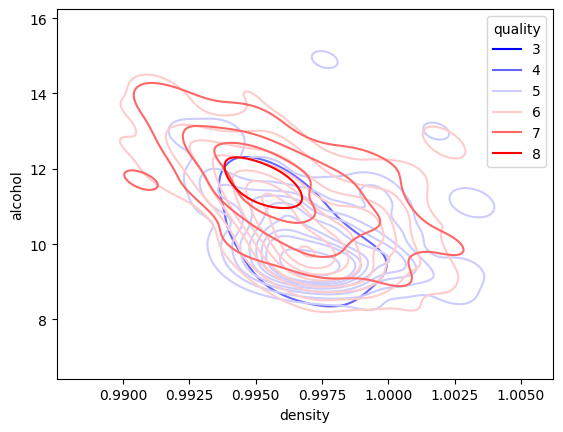

In [67]:
sns.kdeplot(data=df, x="density", y="alcohol", hue="quality",palette="bwr") # Not as i expected.

<Axes: xlabel='chlorides', ylabel='volatile acidity'>

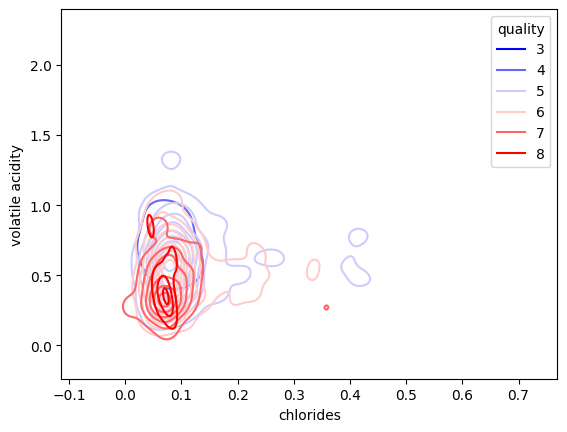

In [68]:
sns.kdeplot(data=df, x="chlorides", y="volatile acidity",hue="quality",palette="bwr")

In [69]:
df.loc[:, "chlorides_volatile_acid_effect"] = df["volatile acidity"]/df["chlorides"]
df.loc[:, "wine_flavor_metrics"] =  (df["sulphates"]*df["chlorides"]) * 100 / df["alcohol"]

<Axes: xlabel='sulphates', ylabel='chlorides_volatile_acid_effect'>

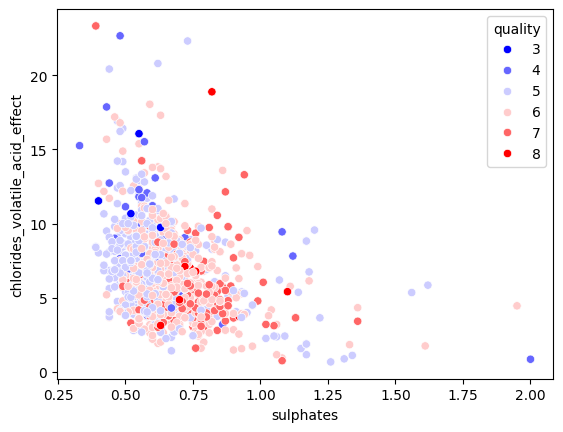

In [70]:
# df.loc[:, "chlorides_volatile_acid_effect"] = df["chlorides"] * df["volatile acidity"]
df.loc[:, "chlorides_volatile_acid_sulphates_effect"] = df["chlorides_volatile_acid_effect"] /df["sulphates"]

# sns.kdeplot(data=df, x="sulphates", y="chlorides_volatile_acid_effect",hue="quality",palette="bwr")
sns.scatterplot(data=df, x="sulphates", y="chlorides_volatile_acid_effect",hue="quality",palette="bwr")

<Axes: xlabel='wine_flavor_metrics', ylabel='Density'>

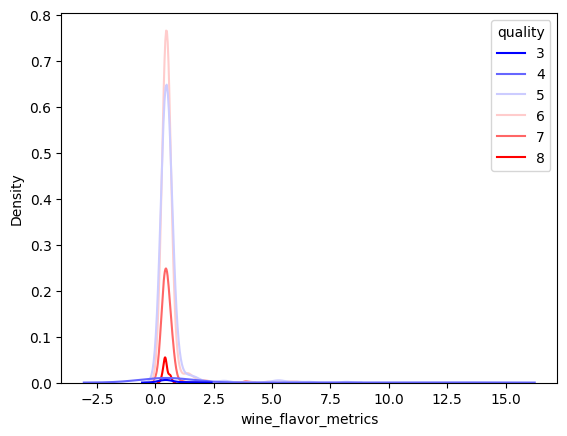

In [71]:
sns.kdeplot(data=df, x="wine_flavor_metrics",hue="quality",palette="bwr")

<Axes: xlabel='wine_flavor_metrics', ylabel='alcohol'>

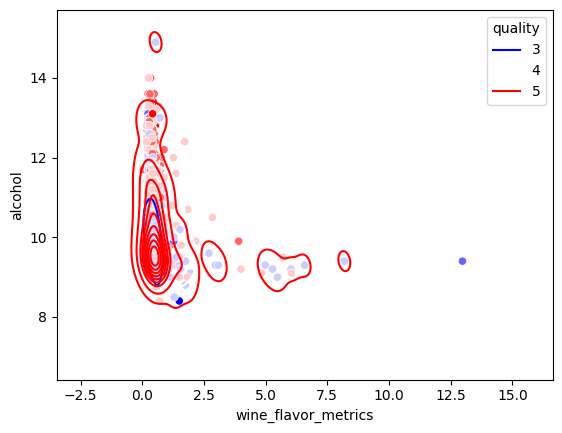

In [72]:
sns.scatterplot(data=df, x="wine_flavor_metrics", y="alcohol",hue="quality",palette="bwr")
sns.kdeplot(data=df.loc[df["quality"] < 6], x="wine_flavor_metrics", y="alcohol",hue="quality",palette="bwr") # with the combination of alcohol, other factors would facilitate deciding the qualtiy

<Axes: xlabel='alcohol', ylabel='alcohol'>

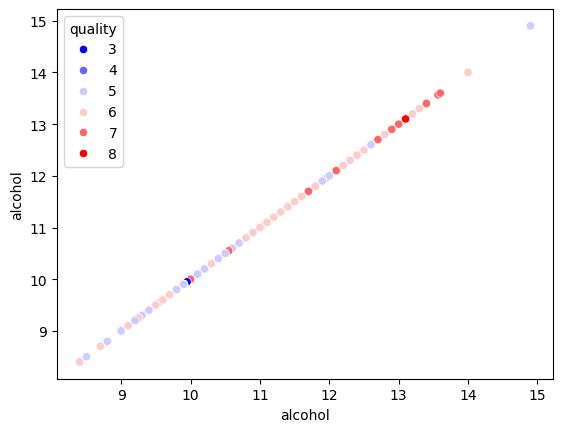

In [73]:
sns.scatterplot(data=df, x="alcohol", y="alcohol",hue="quality",palette="bwr")

[0.99557  0.99668  0.997845]


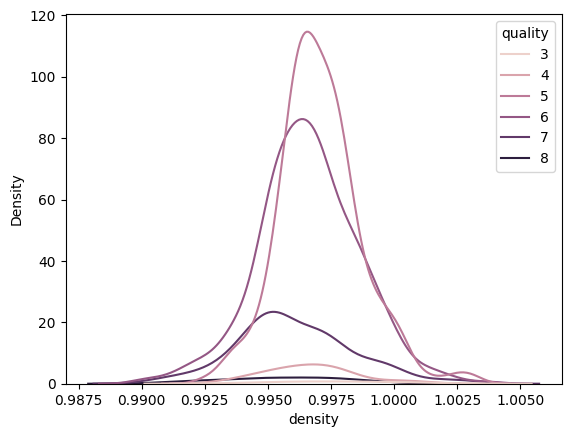

In [74]:
sns.kdeplot(data=df, x="density", hue="quality")

percentile = np.percentile(df["density"], [25, 50, 75])
print(percentile)

Variable              : Correlation to Target
--------                ---------------------
fixed acidity         : 0.121970
volatile acidity      : -0.407394
citric acid           : 0.240821
residual sugar        : 0.022002
chlorides             : -0.124085
free sulfur dioxide   : -0.063260
total sulfur dioxide  : -0.183339
density               : -0.175208
pH                    : -0.052453
sulphates             : 0.257710
alcohol               : 0.484866
quality               : 1.000000
quality_label         : 0.809497
quality_encoded       : 1.000000
sulphates_sugar_ratio : 0.145599
free_sulfur_dioxide_ratio: 0.186621
non_free_sulfur_dioxide: -0.197714
citric_fixed_acidity_ratio: 0.228415
total_acid            : 0.101720
citric_acid_ratio     : 0.237774
fixed_acidity_ratio   : 0.252951
volatitlity_acidity_ratio: -0.359308
good_acidity_ratio    : 0.359308
citric_fixed_acid     : 0.138162
total_acid_alcohol_ratio: -0.116924
pH_alcohol_ratio      : 0.508829
good_acidity_alchol_containm

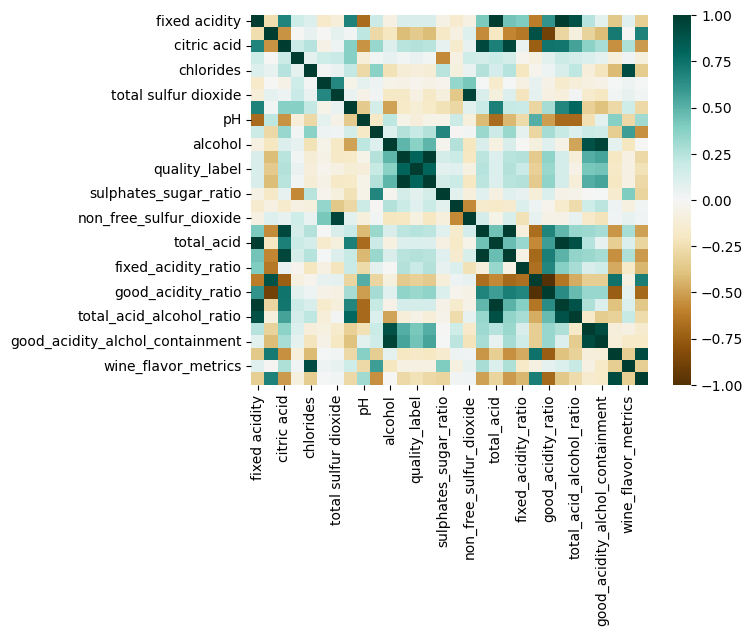

In [101]:
# Data pre-processing
datab = df.drop("Id", axis = 1)

g = sns.heatmap(datab.corr(),cmap="BrBG",annot=False)

# Printing the correlation coeffecient between each variable and the output variable (wine quality)
print("%-22s: %s" % ("Variable", "Correlation to Target"))
print("%-22s  %s" % ("--------", "---------------------"))

for i in range(datab.shape[1] - 1):
    label = datab.columns[i]
    correlation = np.corrcoef(datab[label], datab["quality"])[0, 1]
    print("%-22s: %f" % (label, correlation))

# After analysis of the correlation coeffecients, drop the columns with very low correlation coeffecients
datab = datab.drop("residual sugar", axis = 1)
datab = datab.drop("pH", axis = 1)

# Convert to numpy array for simpler matrix operations
data = np.array(datab)
np.random.shuffle(data)

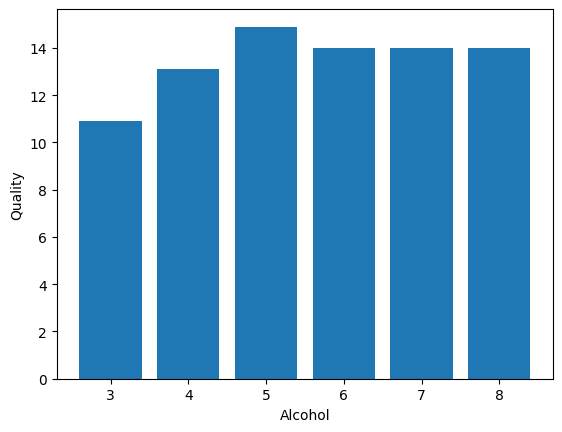

In [108]:
plt.bar(df['quality'], df['alcohol'])
plt.xlabel('Alcohol')
plt.ylabel('Quality')
plt.show()


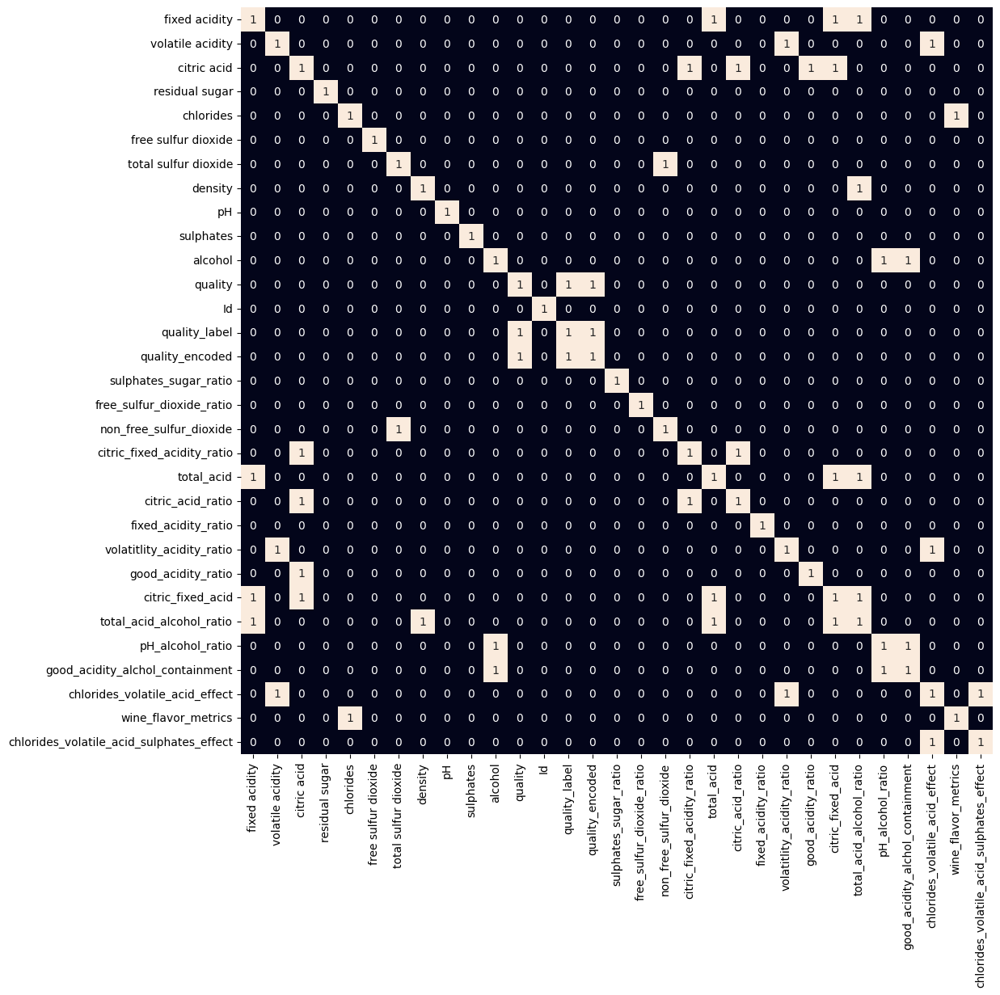

In [110]:
plt.figure(figsize=(12, 12))
sns.heatmap(df.corr()>0.7, annot=True, cbar=False)
plt.show()